## Setup

In [1]:
# !nvidia-smi
!pip install diffusers==0.8.0
!pip install transformers scipy ftfy
!pip install "ipywidgets>=7,<8"

import pdb
import torch
from diffusers import StableDiffusionPipeline
from tqdm.auto import tqdm
from torch import autocast
from PIL import Image
import pdb

## Load Pipeline

In [2]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)  
pipe = pipe.to("cuda")
tokenizer, text_encoder, unet, scheduler, vae = pipe.tokenizer, pipe.text_encoder, pipe.unet, pipe.scheduler, pipe.vae

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

In [3]:
max_length = tokenizer.model_max_length
torch_device = 'cuda'
height=512
width=512

def vanila(prompt, latents, num_inference_steps=50, guidance_scale=10): 
    batch_size = latents.size()[0]
    uncond_input = tokenizer(
      [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
    text_input_tmp = tokenizer(prompt * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
    emb0 = text_encoder(text_input_tmp.input_ids.to(torch_device))[0]
    latents = latents.to(torch_device) 
    scheduler.set_timesteps(num_inference_steps)
    
    with autocast("cuda"):
        for i, t in tqdm(enumerate(scheduler.timesteps)):
            # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
            latent_model_input = torch.cat([latents] * 2)
            # predict the noise residual
            with torch.no_grad():
                noise_pred = unet(latent_model_input, t, 
                                  encoder_hidden_states=torch.cat([uncond_embeddings, emb0])).sample
                # perform guidance
                noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
                # compute the previous noisy sample x_t -> x_t-1
                latents = scheduler.step(noise_pred, t, latents).prev_sample

    with torch.no_grad():
        latents = 1 / 0.18215 * latents
        image = vae.decode(latents).sample

    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")

    return images

def concept_transfer(prompts, latents, num_inference_steps=50, guidance_scale=10): 
    batch_size = latents.size()[0]
    uncond_input = tokenizer(
      [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]   
    
    text_input_tmp = tokenizer(prompts[0] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
    emb0 = text_encoder(text_input_tmp.input_ids.to(torch_device))[0]
    text_input_tmp = tokenizer(prompts[1] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
    emb_add = text_encoder(text_input_tmp.input_ids.to(torch_device))[0]
    text_input_tmp = tokenizer(prompts[2] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
    emb_minus = text_encoder(text_input_tmp.input_ids.to(torch_device))[0]

    latents = latents.to(torch_device) 
    scheduler.set_timesteps(num_inference_steps)
   
    with autocast("cuda"):
        for i, t in tqdm(enumerate(scheduler.timesteps)):
            with torch.no_grad():
                latent_model_input = torch.cat([latents] * 4)
                noise_pred = unet(latent_model_input, t, 
                                  encoder_hidden_states=torch.cat([uncond_embeddings, emb0, emb_add, emb_minus])).sample                
                noise_pred_uncond, noise_pred_text, noise_pred_text_plus, noise_pred_text_minus = noise_pred.chunk(4)
                noise_pred_text += (noise_pred_text_plus - noise_pred_text_minus) 
                noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
                latents = scheduler.step(noise_pred, t, latents).prev_sample
            
    with torch.no_grad():
        latents = 1 / 0.18215 * latents
        image = vae.decode(latents).sample

    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    
    return images


def make_concept_projector(prompt_plus, prompt_minus, prompt_perp):
    def _concept_proj(prompt, latents, num_inference_steps=50, guidance_scale=10): 
        batch_size = latents.size()[0]
        uncond_input = tokenizer(
          [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
        )
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

        text_input_tmp = tokenizer(prompt * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
        emb0 = text_encoder(text_input_tmp.input_ids.to(torch_device))[0]
        text_input_tmp = tokenizer(prompt_plus * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
        emb_z0 = text_encoder(text_input_tmp.input_ids.to(torch_device))[0]
        text_input_tmp = tokenizer(prompt_minus * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
        emb_z1 = text_encoder(text_input_tmp.input_ids.to(torch_device))[0]
        text_input_tmp = tokenizer(prompt_perp * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
        emb_z_target = text_encoder(text_input_tmp.input_ids.to(torch_device))[0]

        # latents = latents * scheduler.init_noise_sigma
        latents = latents.to(torch_device) 
        scheduler.set_timesteps(num_inference_steps)

        with autocast("cuda"):
            for i, t in tqdm(enumerate(scheduler.timesteps)):
                with torch.no_grad():
                    latent_model_input = torch.cat([latents] * 5)
                    noise_pred = unet(latent_model_input, t, 
                                      encoder_hidden_states=torch.cat([uncond_embeddings, emb0, emb_z0, emb_z1, emb_z_target])).sample                
                    noise_pred_uncond, noise_pred_text0, noise_pred_text_z0, noise_pred_text_z1, noise_pred_text_z_target = noise_pred.chunk(5)

                    ## score difference
                    noise_tmp = noise_pred_text0 - noise_pred_text_z_target                    
                    ## Z direction
                    u = noise_pred_text_z1 - noise_pred_text_z0
                    u /= torch.sqrt((u**2).sum())
                    ## project out Z direction
                    noise_pred_text0 -= (noise_tmp * u).sum() * u

                    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text0 - noise_pred_uncond)
                    latents = scheduler.step(noise_pred, t, latents).prev_sample

        with torch.no_grad():
            latents = 1 / 0.18215 * latents
            image = vae.decode(latents).sample

        image = (image / 2 + 0.5).clamp(0, 1)
        image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
        images = (image * 255).round().astype("uint8")

        return images
    
    return _concept_proj

In [4]:
def image_grid(imgs, rows, cols):
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## Concept Transfer

In [5]:
prompts = ["a portrait of a king", "a portrait of a woman", "a portrait of a man"]
batch_size = 1

num_inference_steps = 50
guidance_scale=10

n_im = 4
ims = []
ims_transfer = []

for i in range(n_im):
    generator = torch.manual_seed(i)
    latent = torch.randn((batch_size, unet.in_channels, height // 8, width // 8),generator=generator, dtype = torch.float16)
    im = vanila(prompts[0], latent, num_inference_steps=num_inference_steps, guidance_scale=guidance_scale)
    im_tr = concept_transfer(prompts, latent, num_inference_steps=num_inference_steps, guidance_scale=guidance_scale)
    ims.append(Image.fromarray(im[0]))
    ims_transfer.append(Image.fromarray(im_tr[0]))

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

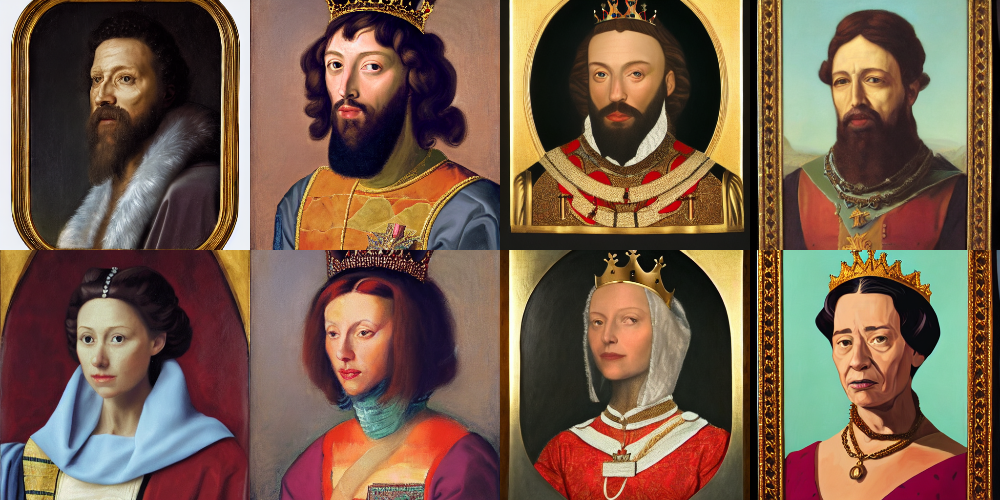

In [6]:
image_grid(ims + ims_transfer, rows=2, cols=n_im)

## Concept Projection

In [7]:
sample_projected_concept = make_concept_projector("a man", "a woman", "a person")

num_inference_steps = 50
guidance_scale=10
n_im = 10
ims = []
ims_proj = []

prompt = "a portrait of a mathematician"
for i in range(n_im):
    generator = torch.manual_seed(i)
    latent = torch.randn((batch_size, unet.in_channels, height // 8, width // 8),generator=generator, dtype = torch.float16)
    im = vanila(prompt, latent, num_inference_steps=num_inference_steps, guidance_scale=guidance_scale)
    im_pj = sample_projected_concept(prompt, latent, num_inference_steps=num_inference_steps, guidance_scale=guidance_scale)
    ims.append(Image.fromarray(im[0]))
    ims_proj.append(Image.fromarray(im_pj[0]))

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

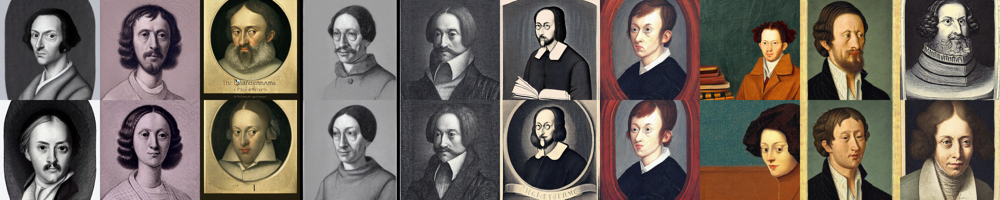

In [8]:
image_grid(ims + ims_proj, rows=2, cols=n_im)